## Analysis of Vascular cells from skeletal muscle
By Monika Litvinukova <br/>
Latest update 27.05.20


### Import required modules

In [1]:
import bbknn
import anndata
import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import seaborn as sb
from matplotlib import rcParams
from matplotlib import colors
import matplotlib.pyplot as plt

/opt/conda/lib/python3.7/site-packages/dask/config.py:161: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  data = yaml.load(f.read()) or {}


In [2]:
## define the function for PCA regression for the bbknn bach correction
def regress_pca(pca, batch):
    regressors = np.zeros(pca.shape, dtype = 'float64')
    regressed = np.zeros(pca.shape, dtype = 'float64')
    for category in np.unique(batch):
        mask = (category == batch)
        regressors[mask,:] = np.mean(pca[mask,:],axis = 0)
    for i in range(pca.shape[1]):
        t = np.c_[np.ones(regressors[:,i].shape),regressors[:,i]]
        b = np.dot(np.dot(np.linalg.inv(np.dot(t.T,t)),t.T),pca[:,i])
        regressed[:,i] = pca[:,i] - b[0] - b[1] * t[:,1]
    return regressed

In [3]:
sc.settings.verbosity = 3
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi = 160, color_map = 'RdPu', dpi_save = 180, vector_friendly = True, format = 'svg')

Running Scanpy 1.4.4.post1, on 2020-05-28 11:05.


## Read in the global object
adata.X is all the genes, raw, adata.raw are all genes, cellbenderised

In [4]:
skm_raw = sc.read_h5ad('/home/jovyan/mona_data/SKM/hca_skm_scGEN_annotated_ml200527_raw.h5ad')
skm_raw

AnnData object with n_obs × n_vars = 52825 × 33538 
    obs: 'CoD', 'NRP', 'age', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'sample', 'scrublet_score', 'source', 'version', 'cell_states_global'
    var: 'gene_ids-mus_SNuc7444586-cells', 'feature_types-mus_SNuc7444586-cells', 'gene_ids-mus_SNuc7468112-cells', 'feature_types-mus_SNuc7468112-cells', 'gene_ids-mus_SNuc7511880-cells', 'feature_types-mus_SNuc7511880-cells', 'gene_ids-5386STDY7600838-cells', 'feature_types-5386STDY7600838-cells', 'gene_ids-5386STDY7645353-cells', 'feature_types-5386STDY7645353-cells', 'gene_ids-5386STDY7645354-cells', 'feature_types-5386STDY7645354-cells', 'gene_ids-mus_SNuc7444585-nuclei', 'feature_types-mus_SNuc7444585-nuclei', 'gene_ids-mus_SNuc7468111-nuclei', 'feature_types-mus_SNuc7468111-nuclei', 'gene_ids-mus_SNuc7511879-nuclei', 'feature_types-mus_SNuc7511879-nuclei', 'gene_ids-5386STDY7600836-nuclei', 'feature_types-5386STDY7600836-nuclei',

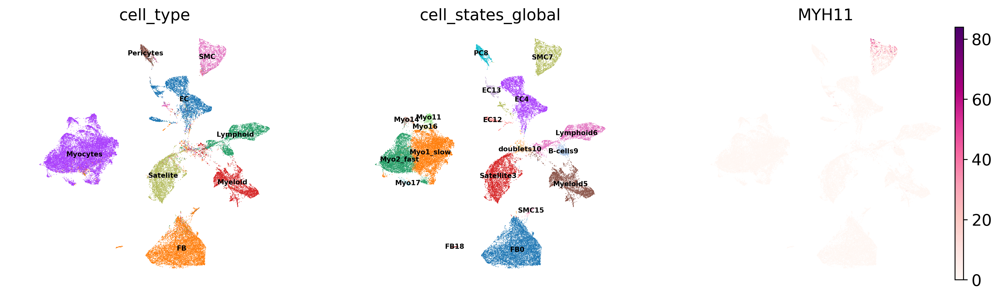

In [5]:
sc.pl.umap(skm_raw, color = ['cell_type', 'cell_states_global', 'MYH11'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [6]:
skm_raw.obs['cell_states_global'].cat.categories

Index(['FB0', 'Myo1_slow', 'Myo2_fast', 'Satellite3', 'EC4', 'Myeloid5',
       'Lymphoid6', 'SMC7', 'PC8', 'B-cells9', 'doublets10', 'Myo11', 'EC12',
       'EC13', 'Myo14', 'SMC15', 'Myo16', 'Myo17', 'FB18'],
      dtype='object')

In [7]:
## Isolate only the vascular cells and save to a single object
vas_raw = skm_raw[skm_raw.obs['cell_states_global'].isin(['EC4', 'SMC7', 'PC8', 'EC12', 'EC13', 'SMC15'])]
vas_raw.shape

(10261, 33538)

In [8]:
vas_raw.write_h5ad('/home/jovyan/mona_data/SKM/Vascular/SKM_vas_QCd_ml200527_raw.h5ad')

/opt/conda/lib/python3.7/site-packages/anndata/_core/anndata.py:1118: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning,


## Split to cells and nuclei and annotate separatelly

In [9]:
vas_raw.obs['cell_source'].cat.categories

Index(['cells', 'nuclei'], dtype='object')

In [10]:
## Isolate only the cells and save to a single object
vas_raw_cells = vas_raw[vas_raw.obs['cell_source'].isin(['cells'])]
vas_raw_cells.shape

(9941, 33538)

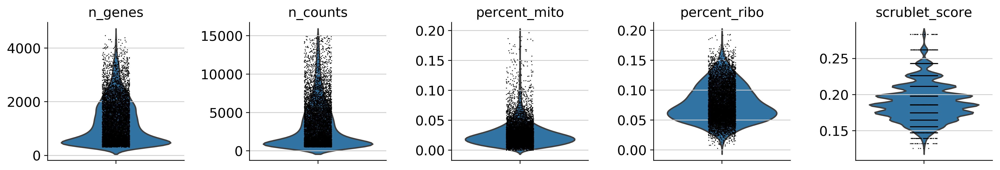

In [11]:
sc.pl.violin(vas_raw_cells, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'],jitter = 0.1, multi_panel = True)

In [12]:
## Isolate only the nuclei and save to a single object
vas_raw_nuc = vas_raw[vas_raw.obs['cell_source'].isin(['nuclei'])]
vas_raw_nuc.shape

(320, 33538)

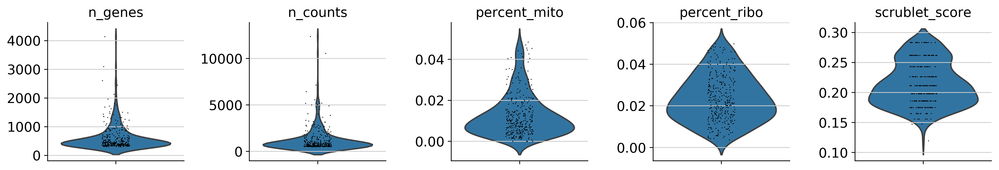

In [13]:
sc.pl.violin(vas_raw_nuc, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', 'scrublet_score'],jitter = 0.1, multi_panel = True)

In [14]:
markers = ['PECAM1', 'CDH5', 'VWF',  ##pan-EC
'RGCC', 'CA4', 'AQP1',  ##capillary EC
'SEMA3G', 'HEY1', 'DLL4', 'GJA4', ##artEC
'ACKR1', 'NR2F2', 'DLL1', 'PLVAP', 'PLAT',  ##venEC
 'JUN', 'FOS', 'ATF3',  ##activEC (or stressed)
'SMOC1', 'INHBA', 'NPR3', 'POSTN',  ##endocardial cells
'PROX1', 'PDPN', 'MMRN1', 'CCL21', 'PTPRE',  ##lnEC
'CXCL11','CXCL10','CCL8', 'ICAM1', 'VCAM1', 'CX3CL1', ##Ec_AgP
'RGS5', 'PDGFRB', 'CD36',  ## perivascular
'ABCC9', 'KCNJ8', 'CSPG4', ##PCs
'MYH11', 'ACTA2', 'TAGLN', 'CNN1',  ##SMCs
'TBX1', 'WT1', 'MSLN', 'CALB2', 'PRG4'] ##mesothelial

## Cells only

### Pre-process the dataset

In [15]:
vas_cells = vas_raw_cells.copy()
sc.pp.normalize_per_cell(vas_cells, counts_per_cell_after = 1e4)
sc.pp.log1p(vas_cells)
vas_cells.raw = vas_cells.copy()

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [16]:
sc.pp.highly_variable_genes(vas_cells, flavor = 'seurat')
cells_hvg = vas_cells[:, vas_cells.var['highly_variable']]
cells_hvg.shape

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


(9941, 3822)

In [17]:
sc.pp.scale(cells_hvg, max_value = 10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [18]:
sc.pp.pca(cells_hvg, n_comps = 50, use_highly_variable = True, svd_solver = 'arpack')
sc.pp.neighbors(cells_hvg)
sc.tl.umap(cells_hvg)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:06)
computing neighbors
    using 'X_pca' with n_pcs = 50


/opt/conda/lib/python3.7/site-packages/numba/compiler.py:602: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../opt/conda/lib/python3.7/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  self.func_ir.loc))
/opt/conda/lib/python3.7/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../opt/conda/lib/python3.7/site-packages/umap/utils.py", line 409:
@numba.njit(

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:26)


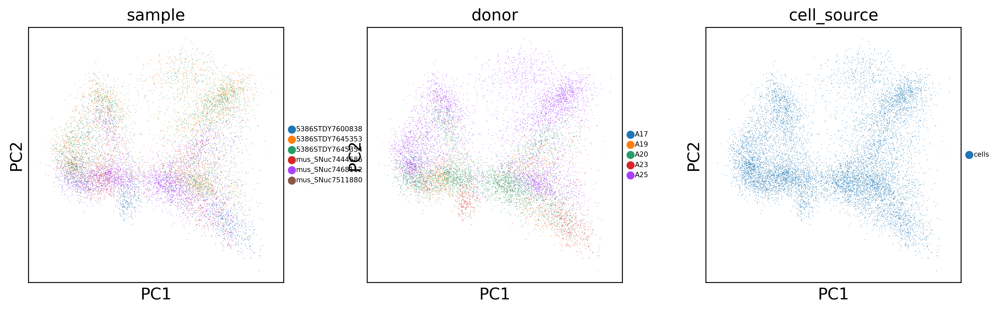

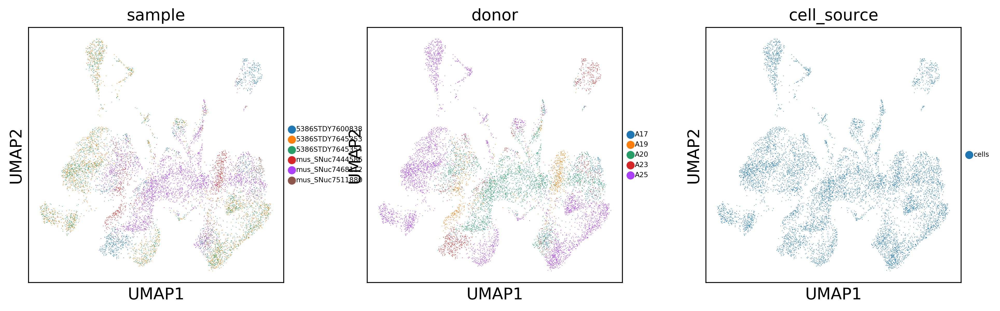

In [19]:
sc.pl.pca_scatter(cells_hvg, color = ['sample', 'donor', 'cell_source'], size = 1, legend_fontsize = 6)
sc.pl.umap(cells_hvg, color = ['sample', 'donor', 'cell_source'], size = 1, legend_fontsize = 6)

### Batch correction

In [20]:
## bbknn with the LR - combined donor and source
lrkp9_combined_cells = cells_hvg.copy()
lrkp9_combined_cells.obs['combined'] = [lrkp9_combined_cells.obs.loc[i,'donor'] + lrkp9_combined_cells.obs.loc[i,'cell_source'] for i in lrkp9_combined_cells.obs_names]
lrkp9_combined_cells.obsm['X_pca_original'] = lrkp9_combined_cells.obsm['X_pca'].copy()
lrkp9_combined_cells.obsm['X_pca'] = regress_pca(lrkp9_combined_cells.obsm['X_pca'], lrkp9_combined_cells.obs['combined'])

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


... storing 'combined' as categorical


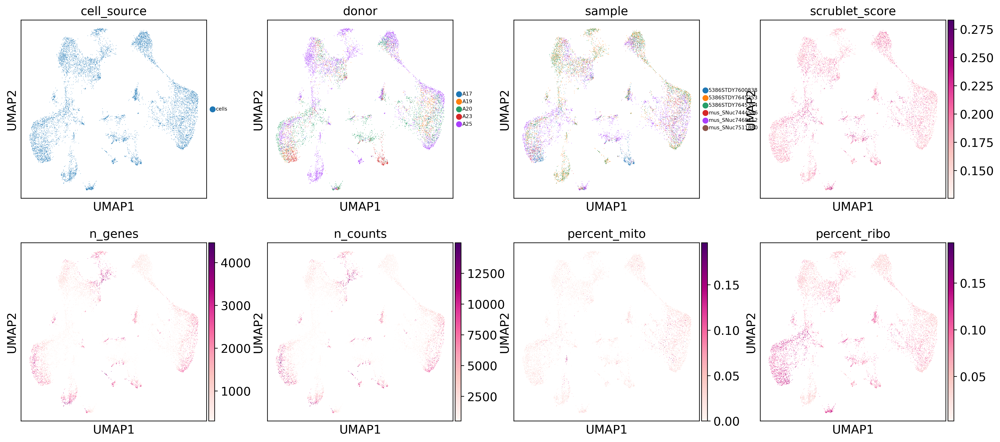

In [30]:
cells_bbknn_lr = bbknn.bbknn(lrkp9_combined_cells, neighbors_within_batch = 6, batch_key = 'combined', approx = True, copy = True, n_trees = 30)
sc.tl.umap(cells_bbknn_lr, min_dist = 0.2, spread = 2, random_state = 1712)
sc.pl.umap(cells_bbknn_lr, color = ['cell_source', 'donor', 'sample', 'scrublet_score' , 'n_genes', 'n_counts', 'percent_mito', 'percent_ribo'], size = 1, legend_fontsize = 6)

running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)


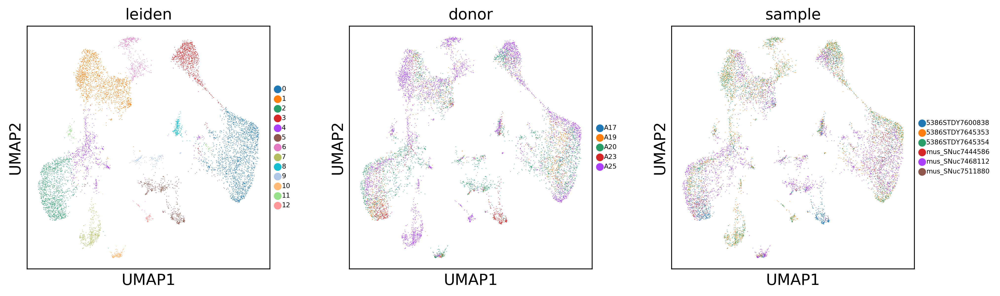

In [32]:
sc.tl.leiden(cells_bbknn_lr, resolution = 0.7, random_state = 1712)
sc.pl.umap(cells_bbknn_lr, color = ['leiden', 'donor', 'sample'], size = 1, legend_fontsize = 6)

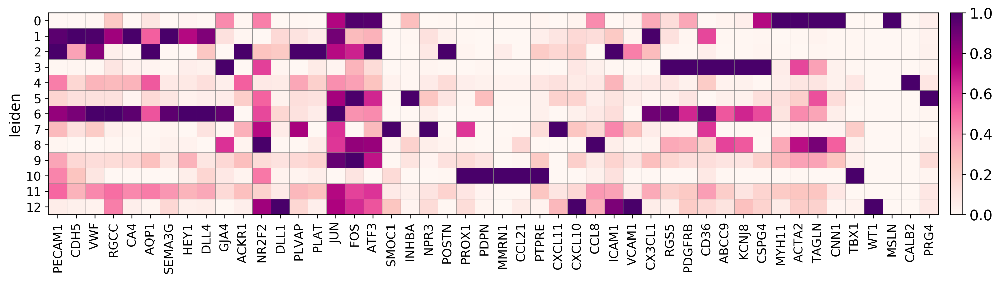

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[15.36, 0, 0.2])

In [33]:
sc.pl.matrixplot(cells_bbknn_lr, markers, groupby = 'leiden', cmap = 'RdPu',  standard_scale = 'var')

In [35]:
sc.tl.rank_genes_groups(cells_bbknn_lr, 'leiden', method = 'wilcoxon', use_raw = True)
result_cells = cells_bbknn_lr.uns['rank_genes_groups']
groups_cells = result_cells['names'].dtype.names
wilcox_cells = pd.DataFrame(
{group + '_' + key[:1]: result_cells[key][group]
    for group in groups_cells for key in ['names', 'logfoldchanges', 'pvals_adj']})
wilcox_cells.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:27)


,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,9_p,10_n,10_l,10_p,11_n,11_l,11_p,12_n,12_l,12_p
0,TAGLN,5.829365,0.0,B2M,2.110034,0.0,ACKR1,6.383615,0.0,RGS5,...,1.939371e-80,CCL21,10.683278,1.193323e-97,NKG7,7.197997,7.373369e-31,CXCL6,11.277658,1.073309e-58
1,DSTN,3.847581,0.0,HLA-B,2.738122,0.0,CD74,3.803296,0.0,MALAT1,...,8.939294e-75,TFF3,7.224578,8.914371e-81,CCL5,6.780381,1.083751e-21,IGFBP2,5.090147,2.136868e-53
2,ACTA2,5.451975,0.0,CLDN5,3.798006,0.0,RAMP3,4.588331,0.0,NDUFA4L2,...,6.329307e-70,TFPI,4.287286,2.381666e-62,GNLY,6.165358,1.083751e-21,CXCL14,6.806955,4.430983e-51
3,MYL9,4.510820,0.0,IFI27,3.237908,0.0,HLA-DRA,3.580688,0.0,IGFBP7,...,1.477347e-59,S100A10,2.676392,1.264040e-50,CXCR4,4.576077,2.614144e-21,CXCL1,7.305319,1.057308e-50
4,TPM2,3.859482,0.0,HLA-A,2.406745,0.0,RPS18,1.253999,0.0,MFGE8,...,2.884099e-25,CLDN5,3.159172,7.739258e-45,HCST,6.105476,4.133829e-21,BGN,4.609706,6.162192e-50
5,MYH11,6.336270,0.0,HLA-C,2.207955,0.0,RPS6,1.307297,0.0,SPARC,...,8.364000e-23,MMRN1,7.490629,4.451554e-41,CD52,4.647688,2.354888e-20,CRABP1,11.139073,1.321972e-47
6,ADIRF,2.932105,0.0,BST2,3.044688,0.0,RPS2,1.717106,0.0,CPE,...,1.317864e-22,RPS12,1.158816,2.387326e-35,CORO1A,5.960535,6.529806e-18,C1S,5.101647,1.682170e-46
7,S100A4,3.883440,0.0,CAV1,2.007459,0.0,PLVAP,4.313683,0.0,CD36,...,6.432037e-22,ATP5F1E,1.593107,9.661684e-35,CST7,7.054314,8.573837e-18,FRZB,4.853479,4.781455e-46
8,SORBS2,4.919630,0.0,TMSB10,2.119609,0.0,AQP1,3.605559,0.0,HIGD1B,...,2.005844e-20,LYVE1,5.077372,3.442372e-34,RPS29,1.061005,5.269321e-16,COL3A1,5.154377,7.747034e-46
9,MYL6,1.738600,0.0,ICAM2,3.475087,0.0,RPS12,1.390629,0.0,PDGFRB,...,5.418945e-20,RPL13,0.863735,3.799258e-31,CCL4,4.840814,6.853272e-15,MDK,5.581482,6.341691e-45


In [36]:
wilcox_cells.to_csv('/home/jovyan/mona_data/SKM/Vascular/DEG_SKM_vas_cells_ml200527_wilcox07.csv', index = False, sep = ',')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


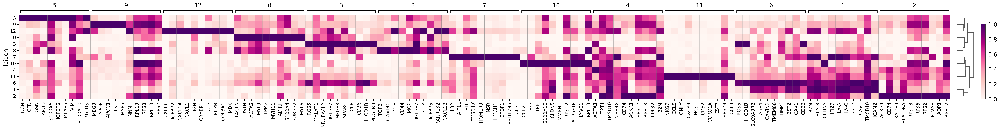

In [37]:
sc.pl.rank_genes_groups_matrixplot(cells_bbknn_lr, n_genes = 10, cmap = 'RdPu', standard_scale = 'var')

### Annotate the dataset

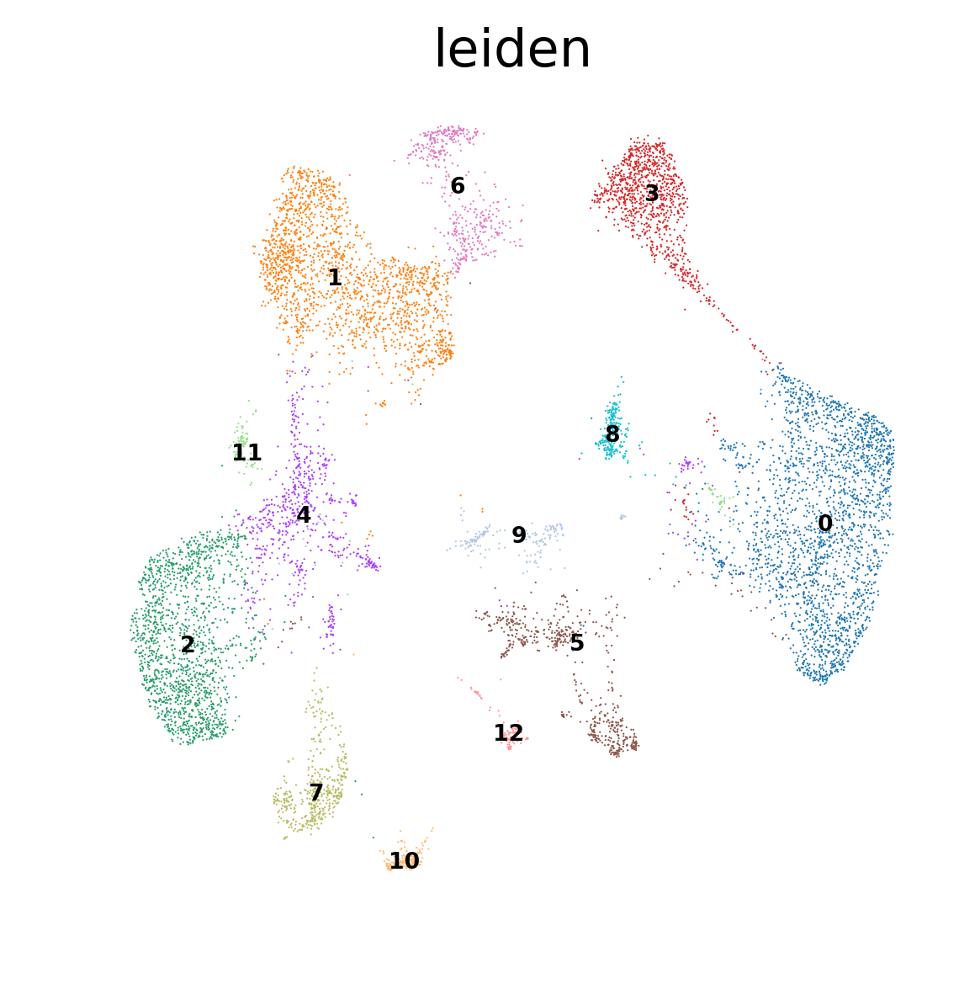

In [38]:
sc.pl.umap(cells_bbknn_lr, color = ['leiden'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [39]:
cells_bbknn_lr.obs['leiden'].cat.categories

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12'], dtype='object')

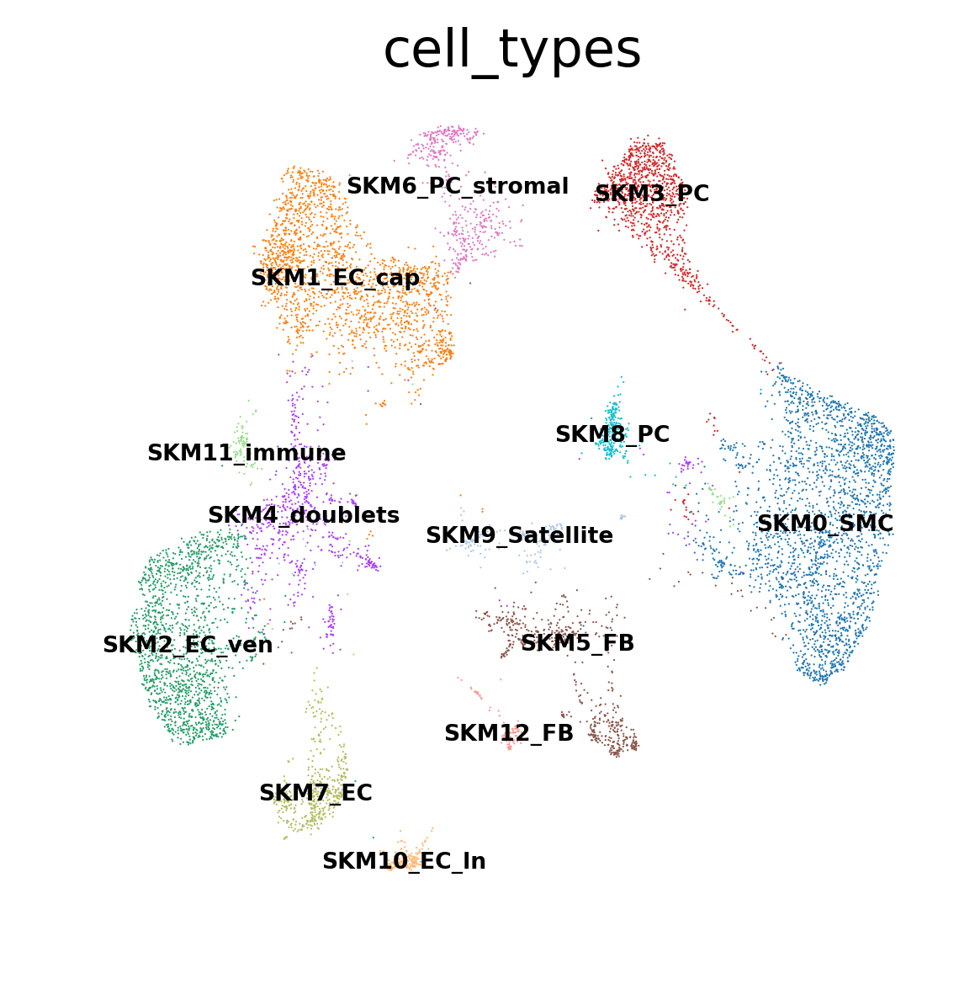

In [40]:
cells_bbknn_lr.obs['cell_types'] = cells_bbknn_lr.obs['leiden']
cells_bbknn_lr.obs['cell_types'].cat.categories = ['SKM0_SMC', 'SKM1_EC_cap', 'SKM2_EC_ven', 'SKM3_PC', 'SKM4_doublets', 'SKM5_FB', 'SKM6_PC_stromal', 'SKM7_EC', 'SKM8_PC', 
                                                   'SKM9_Satellite', 'SKM10_EC_ln', 'SKM11_immune', 'SKM12_FB']
sc.pl.umap(cells_bbknn_lr, color = ['cell_types'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [42]:
## Create a new object with main matrix containing all the genes, raw
ec_cells_export = anndata.AnnData(X = vas_raw_cells.X, obs = cells_bbknn_lr.obs , var = vas_raw_cells.var, obsm = cells_bbknn_lr.obsm)
ec_cells_export

AnnData object with n_obs × n_vars = 9941 × 33538 
    obs: 'CoD', 'NRP', 'age', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'sample', 'scrublet_score', 'source', 'version', 'cell_states_global', 'combined', 'leiden', 'cell_types'
    var: 'gene_ids-mus_SNuc7444586-cells', 'feature_types-mus_SNuc7444586-cells', 'gene_ids-mus_SNuc7468112-cells', 'feature_types-mus_SNuc7468112-cells', 'gene_ids-mus_SNuc7511880-cells', 'feature_types-mus_SNuc7511880-cells', 'gene_ids-5386STDY7600838-cells', 'feature_types-5386STDY7600838-cells', 'gene_ids-5386STDY7645353-cells', 'feature_types-5386STDY7645353-cells', 'gene_ids-5386STDY7645354-cells', 'feature_types-5386STDY7645354-cells', 'gene_ids-mus_SNuc7444585-nuclei', 'feature_types-mus_SNuc7444585-nuclei', 'gene_ids-mus_SNuc7468111-nuclei', 'feature_types-mus_SNuc7468111-nuclei', 'gene_ids-mus_SNuc7511879-nuclei', 'feature_types-mus_SNuc7511879-nuclei', 'gene_ids-5386STDY7600836-nuclei', 'fea

In [ ]:
sc.pl.umap(ec_cells_export, color = ['ACKR1', 'CDH5', 'NPPA'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False, use_raw = False)

In [ ]:
sc.pl.umap(ec_cells_export, color = ['ACKR1', 'CDH5', 'NPPA'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False, use_raw = True)

## Nuclei

In [22]:
vas_nuc = vas_raw_nuc.copy()
sc.pp.normalize_per_cell(vas_nuc, counts_per_cell_after = 1e4)
sc.pp.log1p(vas_nuc)
vas_nuc.raw = vas_nuc.copy()

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


In [23]:
sc.pp.highly_variable_genes(vas_nuc, flavor = 'seurat')
nuc_hvg = vas_nuc[:, vas_nuc.var['highly_variable']]
nuc_hvg.shape

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


(320, 4225)

In [24]:
sc.pp.scale(nuc_hvg, max_value = 10)

/opt/conda/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:869: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [25]:
sc.pp.pca(nuc_hvg, n_comps = 50, use_highly_variable = True, svd_solver = 'arpack')
sc.pp.neighbors(nuc_hvg)
sc.tl.umap(nuc_hvg)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)


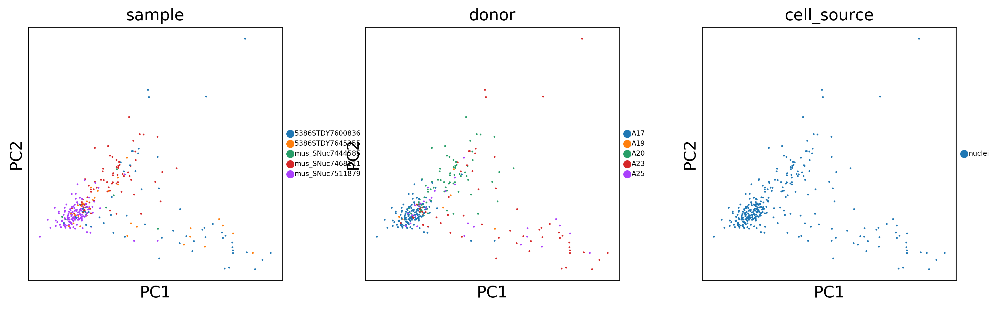

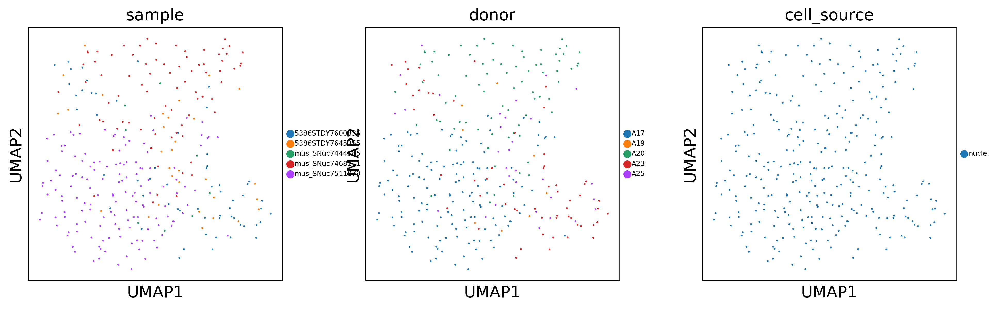

In [26]:
sc.pl.pca_scatter(nuc_hvg, color = ['sample', 'donor', 'cell_source'], size = 10, legend_fontsize = 6)
sc.pl.umap(nuc_hvg, color = ['sample', 'donor', 'cell_source'], size = 10, legend_fontsize = 6)

### Batch correction

In [27]:
## bbknn with the LR - combined donor and source
lrkp9_combined_nuc = nuc_hvg.copy()
lrkp9_combined_nuc.obs['combined'] = [lrkp9_combined_nuc.obs.loc[i,'donor'] + lrkp9_combined_nuc.obs.loc[i,'cell_source'] for i in lrkp9_combined_nuc.obs_names]
lrkp9_combined_nuc.obsm['X_pca_original'] = lrkp9_combined_nuc.obsm['X_pca'].copy()
lrkp9_combined_nuc.obsm['X_pca'] = regress_pca(lrkp9_combined_nuc.obsm['X_pca'], lrkp9_combined_nuc.obs['combined'])

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	'distances', weighted adjacency matrix
	'connectivities', weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)


... storing 'combined' as categorical


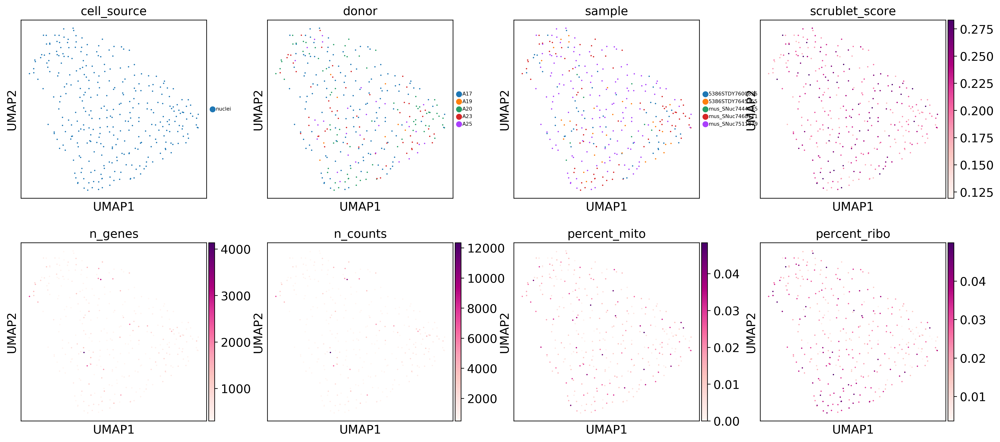

In [34]:
nuc_bbknn_lr = bbknn.bbknn(lrkp9_combined_nuc, neighbors_within_batch = 3, batch_key = 'combined', approx = True, copy = True, n_trees = 30)
sc.tl.umap(nuc_bbknn_lr, min_dist = 0.2, spread = 2, random_state = 1712)
sc.pl.umap(nuc_bbknn_lr, color = ['cell_source', 'donor', 'sample', 'scrublet_score' , 'n_genes', 'n_counts', 'percent_mito', 'percent_ribo'], size = 10, legend_fontsize = 6)

running Leiden clustering
    finished: found 2 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


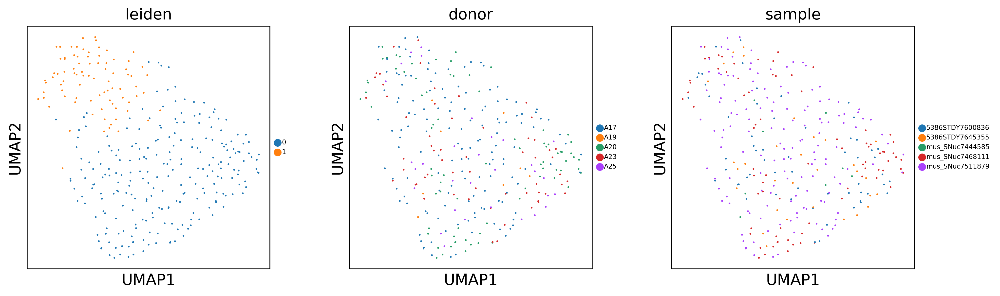

In [43]:
sc.tl.leiden(nuc_bbknn_lr, resolution = 0.4, random_state = 1712)
sc.pl.umap(nuc_bbknn_lr, color = ['leiden', 'donor', 'sample'], size = 10, legend_fontsize = 6)

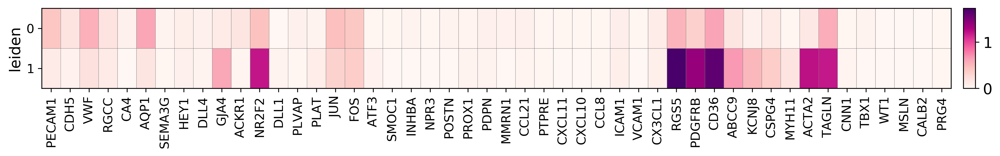

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[15.36, 0, 0.2])

In [45]:
sc.pl.matrixplot(nuc_bbknn_lr, markers, groupby = 'leiden', cmap = 'RdPu',  standard_scale = None)

In [46]:
sc.tl.rank_genes_groups(nuc_bbknn_lr, 'leiden', method = 'wilcoxon', use_raw = True)
result_nuc = nuc_bbknn_lr.uns['rank_genes_groups']
groups_nuc = result_nuc['names'].dtype.names
wilcox_nuc = pd.DataFrame(
{group + '_' + key[:1]: result_nuc[key][group]
    for group in groups_nuc for key in ['names', 'logfoldchanges', 'pvals_adj']})
wilcox_nuc.head(10)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


,0_n,0_l,0_p,1_n,1_l,1_p
0,TRDN,1.614345,0.054438,SPARC,2.965683,0.000190
1,TNNC1,1.133504,0.654037,MYL9,2.723367,0.001680
2,FHL1,1.173046,0.880838,PDGFRB,2.928874,0.001680
3,DCN,1.978476,1.000000,RGS5,2.738004,0.001680
4,IGFBP6,3.430556,1.000000,CALD1,2.025909,0.005855
5,TNNT1,0.993708,1.000000,CD36,2.267001,0.005855
6,NEAT1,0.784706,1.000000,ACTA2,3.948408,0.007468
7,GPX3,1.276926,1.000000,NDUFA4L2,3.220677,0.010066
8,DDIT4,2.425485,1.000000,MFGE8,1.891616,0.015110
9,TNNI1,1.016056,1.000000,HIGD1B,3.252146,0.017341


In [ ]:
wilcox_nuc.to_csv('/home/jovyan/mona_data/SKM/Vascular/DEG_SKM_vas_nuclei_ml200527_wilcox.csv', index = False, sep = ',')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


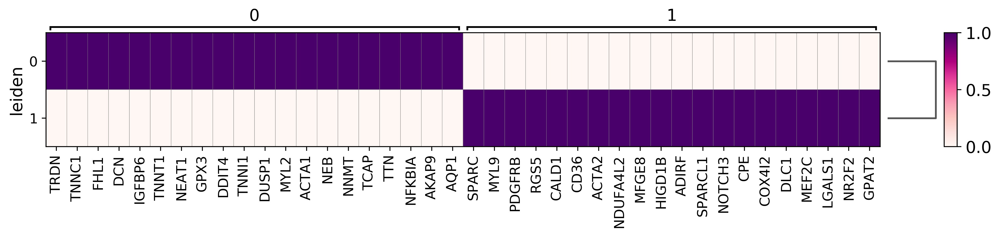

In [47]:
sc.pl.rank_genes_groups_matrixplot(nuc_bbknn_lr, n_genes = 20, cmap = 'RdPu', standard_scale = 'var')

### Annotate the dataset

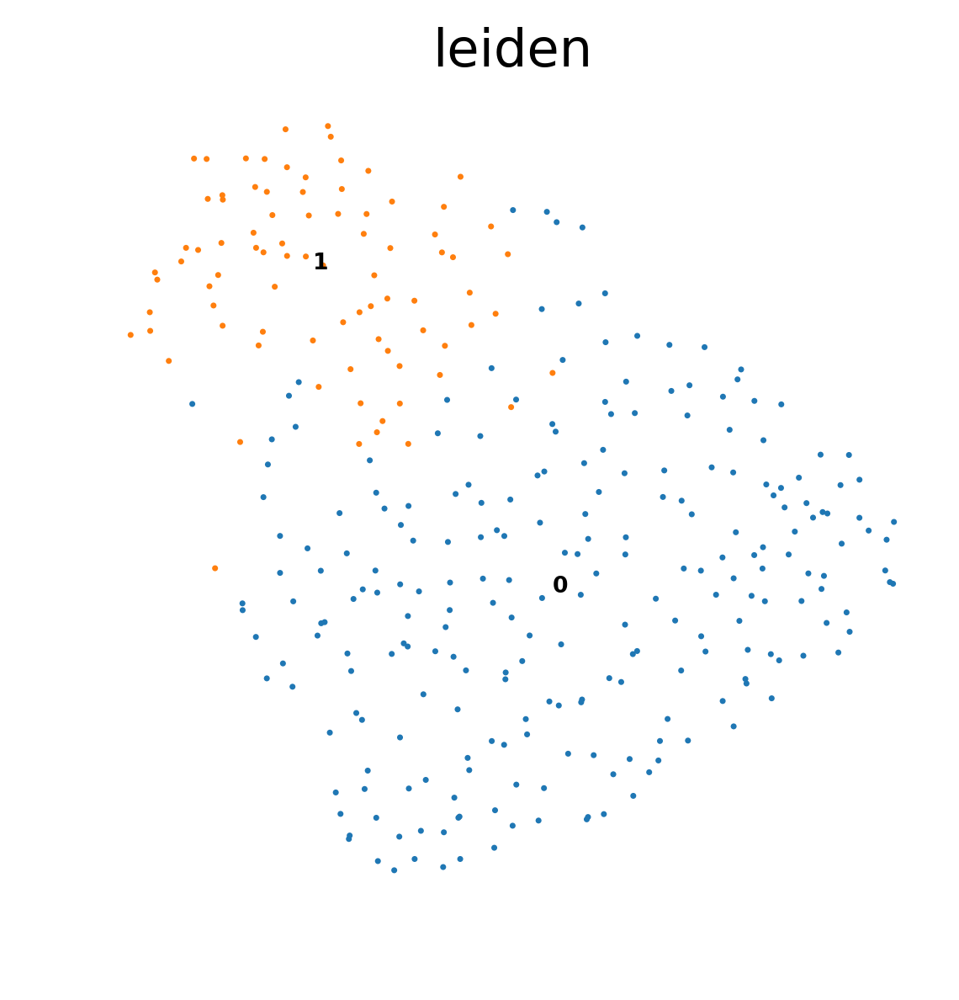

In [49]:
sc.pl.umap(nuc_bbknn_lr, color = ['leiden'], size = 10, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [50]:
nuc_bbknn_lr.obs['leiden'].cat.categories

Index(['0', '1'], dtype='object')

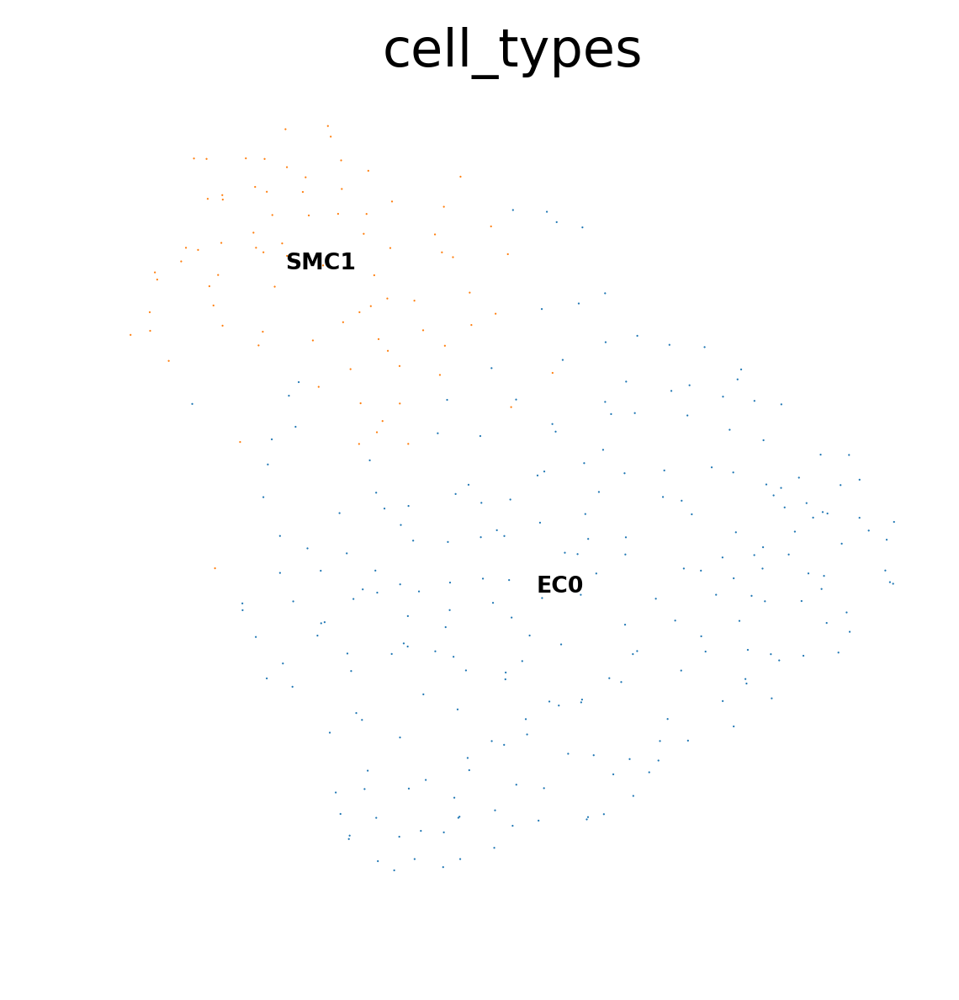

In [51]:
nuc_bbknn_lr.obs['cell_types'] = nuc_bbknn_lr.obs['leiden']
nuc_bbknn_lr.obs['cell_types'].cat.categories = ['EC0', 'SMC1']
sc.pl.umap(nuc_bbknn_lr, color = ['cell_types'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False)

In [52]:
## Create a new object with main matrix containing all the genes, raw
ec_nuc_export = anndata.AnnData(X = vas_raw_nuc.X, obs = nuc_bbknn_lr.obs , var = vas_raw_nuc.var, obsm = nuc_bbknn_lr.obsm)
ec_nuc_export

AnnData object with n_obs × n_vars = 320 × 33538 
    obs: 'CoD', 'NRP', 'age', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'sample', 'scrublet_score', 'source', 'version', 'cell_states_global', 'combined', 'leiden', 'cell_types'
    var: 'gene_ids-mus_SNuc7444586-cells', 'feature_types-mus_SNuc7444586-cells', 'gene_ids-mus_SNuc7468112-cells', 'feature_types-mus_SNuc7468112-cells', 'gene_ids-mus_SNuc7511880-cells', 'feature_types-mus_SNuc7511880-cells', 'gene_ids-5386STDY7600838-cells', 'feature_types-5386STDY7600838-cells', 'gene_ids-5386STDY7645353-cells', 'feature_types-5386STDY7645353-cells', 'gene_ids-5386STDY7645354-cells', 'feature_types-5386STDY7645354-cells', 'gene_ids-mus_SNuc7444585-nuclei', 'feature_types-mus_SNuc7444585-nuclei', 'gene_ids-mus_SNuc7468111-nuclei', 'feature_types-mus_SNuc7468111-nuclei', 'gene_ids-mus_SNuc7511879-nuclei', 'feature_types-mus_SNuc7511879-nuclei', 'gene_ids-5386STDY7600836-nuclei', 'feat

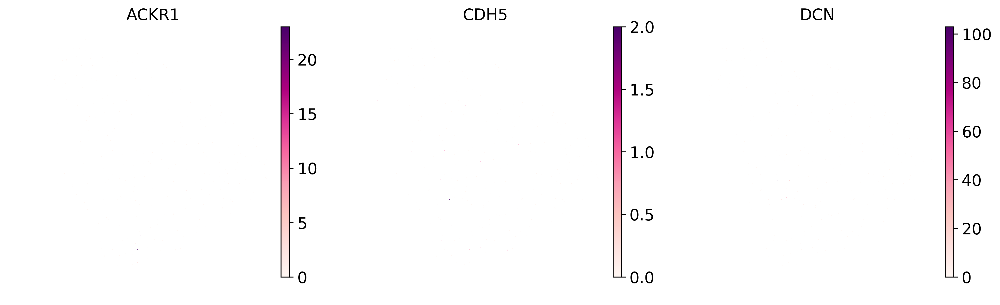

In [54]:
sc.pl.umap(ec_nuc_export, color = ['ACKR1', 'CDH5', 'DCN'], size = 1, legend_fontsize = 6, legend_loc = 'on data', frameon = False, use_raw = False)

## Combine to a single object

In [55]:
vas_merged = ec_cells_export.concatenate(ec_nuc_export, batch_key = 'merged_source', batch_categories = ['cells', 'nuclei'],  join = 'outer')
vas_merged

AnnData object with n_obs × n_vars = 10261 × 33538 
    obs: 'CoD', 'NRP', 'age', 'cell_source', 'cell_states_global', 'cell_type', 'cell_types', 'combined', 'donor', 'gender', 'leiden', 'merged_source', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'sample', 'scrublet_score', 'source', 'version'
    var: 'gene_ids-mus_SNuc7444586-cells-cells', 'feature_types-mus_SNuc7444586-cells-cells', 'gene_ids-mus_SNuc7468112-cells-cells', 'feature_types-mus_SNuc7468112-cells-cells', 'gene_ids-mus_SNuc7511880-cells-cells', 'feature_types-mus_SNuc7511880-cells-cells', 'gene_ids-5386STDY7600838-cells-cells', 'feature_types-5386STDY7600838-cells-cells', 'gene_ids-5386STDY7645353-cells-cells', 'feature_types-5386STDY7645353-cells-cells', 'gene_ids-5386STDY7645354-cells-cells', 'feature_types-5386STDY7645354-cells-cells', 'gene_ids-mus_SNuc7444585-nuclei-cells', 'feature_types-mus_SNuc7444585-nuclei-cells', 'gene_ids-mus_SNuc7468111-nuclei-cells', 'feature_types-mus_SNuc7468111-nuclei-cells', 

In [56]:
vas_merged.write('/home/jovyan/mona_data/SKM/Vascular/SKM_vas_merged_ml200528_raw.h5ad')

... storing 'cell_source' as categorical
... storing 'cell_states_global' as categorical
... storing 'cell_type' as categorical
... storing 'cell_types' as categorical
... storing 'combined' as categorical
... storing 'leiden' as categorical
... storing 'sample' as categorical
... storing 'source' as categorical
... storing 'version' as categorical
... storing 'feature_types-mus_SNuc7444586-cells-cells' as categorical
... storing 'feature_types-mus_SNuc7468112-cells-cells' as categorical
... storing 'feature_types-mus_SNuc7511880-cells-cells' as categorical
... storing 'feature_types-5386STDY7600838-cells-cells' as categorical
... storing 'feature_types-5386STDY7645353-cells-cells' as categorical
... storing 'feature_types-5386STDY7645354-cells-cells' as categorical
... storing 'feature_types-mus_SNuc7444585-nuclei-cells' as categorical
... storing 'feature_types-mus_SNuc7468111-nuclei-cells' as categorical
... storing 'feature_types-mus_SNuc7511879-nuclei-cells' as categorical
... sto